# Stanford Cars - NB2: Learning Rate Tuning

A dive into Learning Rate tuning using the 1-cycle policy.
#### TL;DR
- Test set accuracy of **88.19%** and a Top5 Accuracy of **97.53%** was achieved
- Accuracy is **up 3.2%** from the [previous notebook](https://github.com/morganmcg1/Projects/blob/master/stanford-cars/1_stanford_cars_basic.ipynb)
- This result was achieved in **31 epochs** using ResNET152 and fastai's implementation of the 1-cycle policy
- Training this model consisted of:

  1. Training the final layer
  2. Unfreezing and training the entire model
  3. Resizing the images from 224 to 299 and training the final layer again


- Further training on the unfrozen model using resized images lead to *worse results* than those achieved at Stage-3; test set accuracy from the best model from Stage-4 was 85.31% (96.19% Top5 accuracy)
- I found that when training with the 1-cycle policy with differentiable learning rates on an unfrozen model, you can select a `max_lr` a couple of orders of magnitude larger than what the learning rate finder might suggest. (lrs=[lr/100, lr/10, lr] in this case)
- While training the unfrozen layers, fine-grained differential learning rates produced higher accuracies than coarser ones, i.e. [lr/100, lr/10, lr] better than [lr/9,lr/3,lr]

#### Unfrozen Layers = Higher max_lr
- When training the **unfrozen model** in Stages 2 and 4 I found that the `fit_one_cycle` protocol allowed me to select a higher max learning rate than the learning rate finder might suggest:
  - In Stage-2 it suggested between **1e-6 to 1e-5** whereas the best results was achieved with **max_lr = 1e-3**.
  - In Stage-4 it suggested between **5e-7 to 1e-6** whereas the best results were achieved with **max_lr = 5e-4**. 
  
This was not the case for Stages 1 or 3 where we were just training the top layer, using a higher lr than suggested lead to the model's loss and accuracy becoming wildy erratic. However it is important to note that differentiable learning rates of [lr/100, lr/10, lr] were used in Stages 2 and 4, so the lower layers were actually being trained **at more or less the same lr as the learning rate finder suggested**. The takeaway here is that in this case you can select a `max_lr` a couple of orders of magnitude larger than what the learning rate finder might suggest (and its probably best to use [lr/100, lr/10, lr] as your differentiable lrs)

#### 1-cycle policy
The benefits of using Leslie Smith's 1-cycle policy* (I used the fastai implementation of `.fit_one_cycle`) can really be seen, achieving much stronger results that the `.fit` method. When training all model layers (unfrozen model) differential learning rates also result in higher accuracy than using a constant learning rate. 

For reference, the fastai `fit_one_cycle` implementation has the follow parameters set as default:
- `moms= (0.95, 0.85)` - range of momentum used
- `div_factor = 25` - the factor max_lr is divided by at the beginning and end of the policy
- `pct_start = 30%` - at what point in the cycle should the lr reach max_lr

\*See [Sebastian Gugger's explanation of the 1-cycle policy](https://sgugger.github.io/the-1cycle-policy.html) if you would like to learn more. Note that fastai's implementation uses cosine anealing for the second part of the cycle when learning rate is decreasing

### Experiment Results
Learning rate size, training protocol, differentiable lrs (when training unfrozen model) and num epochs used were all recorded. I also recorded the final loss and accuracy values for each experiment as well as noting whether the accuracy was still improving (by more than 0.2%) at the end of the training run. The best performing model in each stage (highest accuracy) was used as the basis for training the next stage.

#### Stage 1 - Initialisation and Training the Final Layer
From the previous notebook in this series it was found that training with `.fit_one_cycle` using lr = 1e-3 for 14 epochs gave the highest accuracy for this stage. The below is a quick example of how much better `.fit_one_cycle` performs over using `.fit` :

| Exp No. | Protocol | lr | lr/x | epochs | train_loss | valid_loss | accuracy  | >= 0.2% inc. in acc |
| --- | --- | --- | --- | --- | ---  | ---  | --- | --- |
| 1 | fit | 1e-3 | NA| 14 | 0.4747 | 0.8899 | 0.76474 | no, last inc at ep11 |
| 2 | fit | 1e-2 | NA| 14 | 4.2777 | 6.8065 | 0.09459 | no, erratic, lr too high |
| **3** | **fit_one_cycle** | **1e-2** | **NA**| **14** | **0.4897** | **0.69667** | **0.80098** | **no** |
| 4 | fit_one_cycle | 1e-1 | NA| 10 | 5.3011 | 585.0996 | 0.0098 | no, erratic, lr too high |

#### Stage 2 - Unfreeze all layers

The model was unfrozen and the following parameters were experimented with, again using the 1-cycle policy:
- **Learning Rate**
- **Num Epochs**
- **Division of Differential LRs (lr/x)**
    - Here, x stands for the largest denominator used 
    - lr/x = 100 then lrs = [lr/100, lr/10, lr] were used
    - lr/x = 9 then lrs = [lr/9, lr/3, lr] were used 

| Exp No. | lr | lr/x | epochs | train_loss | valid_loss | accuracy  | >= 0.2% inc. in acc** |
| --- | --- | --- | --- | ---  | ---  | --- | --- |
| 1| 1e-3 | NA| 10 | 0.7570 | 0.7776 | 0.7843 | yes |
| 2| 1e-3 | NA| 14 | 0.5696 | 0.6590 | 0.8108 | no, last inc at ep13 |
| 4| 1e-3 | 100 | 6 | 0.4809 | 0.604 | 0.8329 | yes |
| 5 | 1e-3 | 100 | 8 | 0.4206 | 0.5933 | 0.8353 | yes |
| 6 | 1e-3** | 100 | 10 | 0.3187 | 0.5492 | 0.8470 | yes |
| **7** | **1e-3** | **100** | **12** | **0.2721** | **0.5297** | **0.8507** | **yes** |
| 8 | 1e-3 | 100 | 13 | 0.2631 | 0.5325 | 0.8470 | no |
| 8 | 1e-3 | 100 | 14 | 0.2581 | 0.5261 | 0.8439 | no, max was at ep12 |
| 9 | 1e-2 | 100 | 6 | 1.1125 | 1.023 | 0.7309 | yes |
| 10 | 1e-2 | 100 | 8 | 0.93426 | 0.8484 | 0.7641 | yes |
| 11 | 1e-2 | 100 | 12 | 1.0446 | 3.2141 | 0.7291 | yes, but val_loss erratic |
| 12 | 1e-3 | 9 | 6 | 0.6534 |0.6777 | 0.8126 | yes |
| 13 | 1e-3 | 9 | 8 | 0.5686 |0.6395 | 0.8175 | yes |
| 14 | 1e-3 | 9 | 10 | 0.4940 | 0.6691 | 0.8255 | yes |
| 15 | 1e-3 | 9 | 12 | 0.4031 | 2.0453 | 0.8077 | no, yes up to ep11, then getting erratic |
| 16 | 1e-3 | 9 | 14 | 0.3592 | 0.6881 | 0.8261 | no |
| 17 | 1e-2 | 9 | 8 | 5.1260 | 8.5453 | 0.014128 | no |
| 18 | 1e-2 | 9 | 12 | 2.9476 | 4.0143 | 0.3353 | no |

\** whether the last epoch saw an increase of accuracy >= 0.2%, used as an indication of overfitting

#### Stage 3 - Resize images to 299, Freeze and Train the Final Layer Again

The model from experiment 7 in Stage-2 was selected as it resulted in the highest accuracy. These parameters did result in pretty strong overfitting so lets see how this goes...


| Exp No. | lr | epochs | train_loss | valid_loss | accuracy  | >= 0.2% inc. in acc* |
| --- | --- | --- | ---  | ---  | --- | --- |
| 1| 5e-4 |  3 | 0.2509 | 0.4878 | 0.8568 | no |
| 2| 5e-4 |  5 | 0.26438 | 0.4685 | 0.8654 | no |
| 3| 1e-3 |  3 | 0.2470  | 0.4930 | 0.8574 | yes |
| **4**| **1e-3** | **5** | **0.2282** | **0.4685** | **0.8759** | **yes** |
| 5| 1e-3 | 7 | 0.1989 | 0.4731 | 0.8734 | yes |
| 6| 1e-3 | 9 | 0.1834 | 0.4726 | 0.8697 | no |

Very happy with accuracy of 87.6% for the validaton set, lets see if we can improve it further...

#### Stage 4 - Unfreeze all layers
The model from experiment 4 of Stage-3 was selected.

| Exp No. | lr | lr/x | epochs | train_loss | valid_loss | accuracy  | >= 0.2% inc. in acc* |
| --- | --- | --- | --- | ---  | ---  | --- | --- |
| 1| 1e-3 | 100| 5 | 0.2937 | 0.5464 | 0.8495 | yes |
| 2| 1e-3 | 100| 7 | 0.2383 | 0.5505 | 0.8488 | yes | 
| 3| 1e-3 | 100| 9 | 0.2334 | 0.5446 | 0.8501 | no |
| **4**| **5e-4** | **100**| **5** | **0.2406** | **0.5470** | **0.8587** | **yes** |
| 5| 5e-4 | 100| 7 | 0.1879 | 0.5472 | 0.8488 | no |
| 6| 1e-4 | 100| 5 | 0.2233 | 0.5420 | 0.8507 | no |
| 7| 1e-4 | 9| 5 | 0.2457 | 0.5319 | 0.8562 | yes |
| 8| 1e-4 | 9| 7 | 0.1991 | 0.5271 | **0.8587** | yes |
| 9| 1e-4 | 9| 9 | 0.2096 | 0.5352 |  0.8550| no | 
| 10| 1e-5 | 9| 5 | 0.2584 | 0.5479 | 0.8507 | no | 
| 11| 1e-6 | 9| 5 | 0.2515 | 0.5718 | 0.8409 | no | 

The best performing model in Stage-4 was experiment 4, with an accuracy of 85.8% however this is lower that the best from Stage-3, therefore we will stick with the Stage-3 model as our final and best-performing model.

#### Note
For brevity and clarity I have moved a lot of the function definitions from the previous notebook in this series to the `helper_functions` file. The first notebook: https://github.com/morganmcg1/Projects/blob/master/stanford-cars/stanford_cars_benchmark.ipynb contains all code in a single notebook in case that is more convenient for you.

#### Thanks
This and the following notebooks are all thanks to fastai's AMAZING course and library, checkout https://fast.ai for the course and libray, you won't regret it!

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import pandas as pd
from pathlib import Path
import json
from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects
import matplotlib.pyplot as plt

import scipy.io as sio

In [2]:
from fastai import *
from fastai.vision import *

In [3]:
from helper_functions import compare_most_confused, compare_top_losses

## Getting the Data

In [4]:
path = 'data/stanford-cars/'

In [5]:
labels_df = pd.read_csv('labels_df.csv')
labels_df.head()

,filename,bbox_x1,bbox_y1,bbox_x2,bbox_y2,class_id,class_name,is_test,filename_cropped,bbox_h,bbox_w
0,00001.jpg,39,116,569,375,14,Audi TTS Coupe 2012,0,cropped_00001.jpg,260,531
1,00002.jpg,36,116,868,587,3,Acura TL Sedan 2012,0,cropped_00002.jpg,472,833
2,00003.jpg,85,109,601,381,91,Dodge Dakota Club Cab 2007,0,cropped_00003.jpg,273,517
3,00004.jpg,621,393,1484,1096,134,Hyundai Sonata Hybrid Sedan 2012,0,cropped_00004.jpg,704,864
4,00005.jpg,14,36,133,99,106,Ford F-450 Super Duty Crew Cab 2012,0,cropped_00005.jpg,64,120


Lets look closer at the data, how many class_ids do we have? Does it match the number of class names?

## Data Loading
Used the standard fastai image transforms and held out 20% of the training data for validation.

In [36]:
SZ = 224
SEED = 42
LABEL = 'class_name'

car_tfms = get_transforms()

trn_labels_df = labels_df.loc[labels_df['is_test']==0, ['filename', 'class_name', 'class_id']].copy()

src = (ImageItemList.from_df(trn_labels_df, path, folder='train', cols='filename')
                    .random_split_by_pct(valid_pct=0.2, seed=SEED)
                    .label_from_df(cols=LABEL))

data = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))

Having a look at the images in our datablock you can see result of the image transforms:

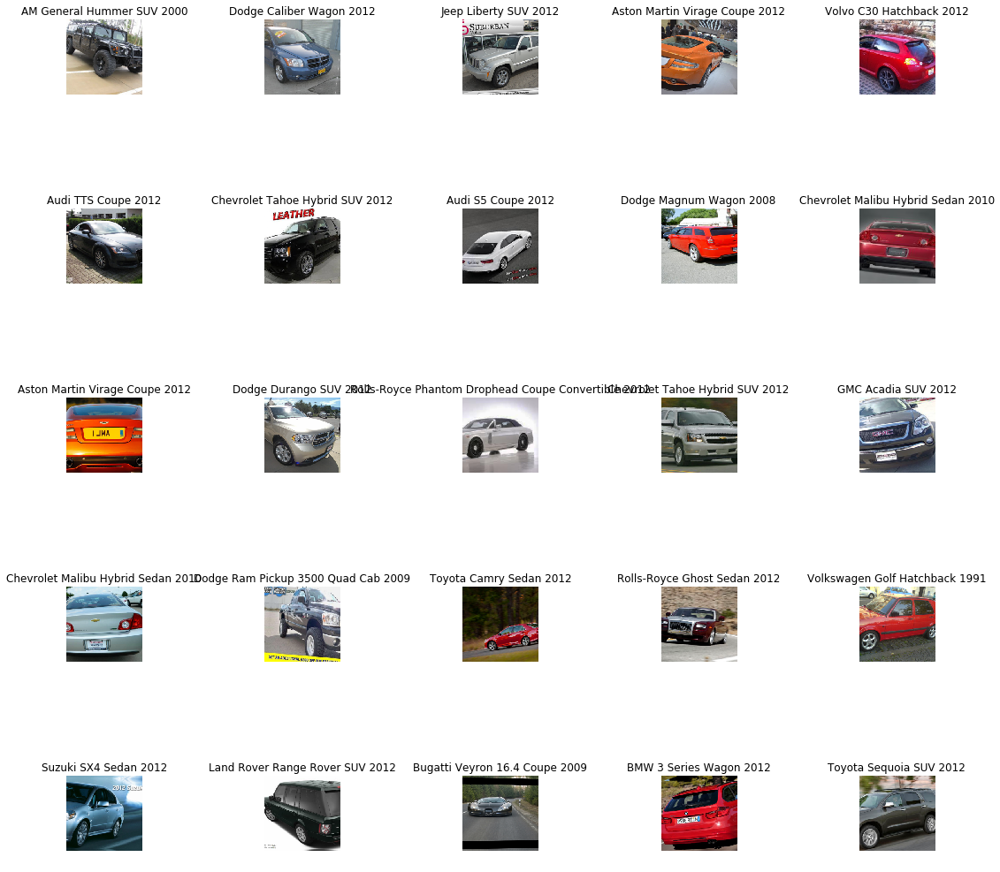

In [7]:
data.show_batch(rows=5, figsize=(15,15))

## Lets Get Training

Define the model architecture and parameters we would like to use. Why ResNET152? Honestly just going by the philosophy that bigger is better! Comparing the performance of different ResNETs might be an interesting experiment for the future

In [8]:
arch = models.resnet152

Because we are using such a large model, and images of 224, I had to start with a batch size of 32 to avoid out of memory erros

In [9]:
data.batch_size = 32
data.batch_size

32

Use fastai's v1 `create_cnn` function to create a standard convolution NN learner

In [10]:
learn = create_cnn(data, arch, metrics=[accuracy])

### Stage-1

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


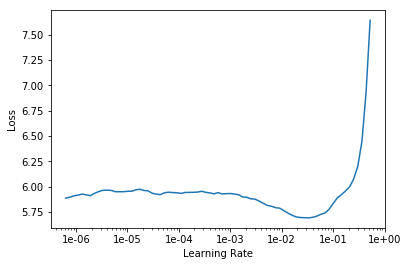

In [11]:
learn.lr_find()
learn.recorder.plot()

In [12]:
lr = 1e-2

I found that 14 epochs was a good place to stop as the model started to overfit while the accuracy didn't improve further

In [13]:
learn.fit_one_cycle(14, max_lr = lr)

epoch,train_loss,valid_loss,accuracy
1,4.211462,3.311337,0.234644
2,3.095753,3.203396,0.269656
3,3.089338,4.551490,0.147420
4,2.846546,3.715818,0.216216
5,2.411369,2.370257,0.402948
6,2.168933,2.357647,0.423219
7,1.833060,1.697872,0.531327
8,1.505619,1.437747,0.625307
9,1.247442,1.164341,0.689803
10,1.009467,0.928762,0.738329


In [14]:
learn.save('2_stage-1-rn152-lr_tuning')

### Stage-2

In [15]:
learn.unfreeze()

In [16]:
data.batch_size = 16
learn.data = data

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


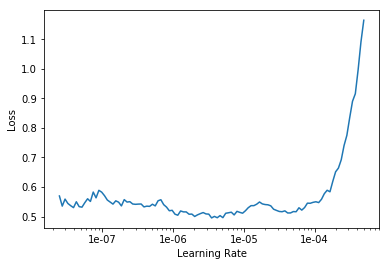

In [17]:
learn.lr_find(start_lr=1e-8, end_lr=9e-1, num_it=200)
learn.recorder.plot()

In [21]:
lr = 1e-3
lrs = np.array([lr/100,lr/10,lr])

In [19]:
learn.fit_one_cycle(12, lrs)

epoch,train_loss,valid_loss,accuracy
1,0.672942,0.760649,0.783170
2,1.076982,1.097460,0.716830
3,1.205574,1.234216,0.673833
4,1.183158,1.039966,0.722359
5,1.087868,1.005000,0.724816
6,0.868669,0.814681,0.773956
7,0.723463,0.726392,0.797912
8,0.542975,0.626525,0.823096
9,0.441516,0.568662,0.840909
10,0.354598,0.556282,0.843980


In [22]:
learn.save('2_stage-2-rn152-lr_tuning_1e-3_100_e12')

### Stage-3

Resize the images

In [38]:
SZ = 299
SEED = 42
LABEL = 'class_name'

car_tfms = get_transforms()

data = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))

data.batch_size = 16

In [24]:
learn.data = data

In [25]:
learn.freeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


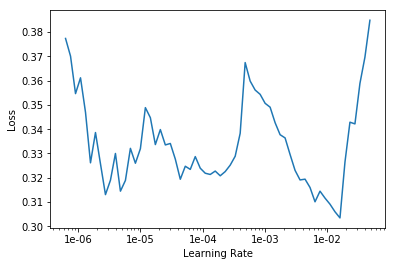

In [26]:
learn.lr_find()
learn.recorder.plot()

In [27]:
lr=1e-3

In [28]:
learn.fit_one_cycle(5, lr)

epoch,train_loss,valid_loss,accuracy
1,0.331892,0.482409,0.864251
2,0.266608,0.486608,0.863636
3,0.264217,0.468193,0.872236
4,0.220115,0.456247,0.872236
5,0.200153,0.451756,0.875921


In [29]:
learn.save('stage-3-rn152-high_lr_1e-3_5e')

### Test

Load the Test Set

In [30]:
SZ = 299
SEED = 42
LABEL = 'class_name'

car_tfms = get_transforms()

src = (ImageItemList.from_df(labels_df, path, folder='merged', cols='filename')
       # the 'is_test' column has values of 1 for the test set
       .split_from_df(col='is_test')
       .label_from_df(cols=LABEL))

data_test = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))

Assign the full dataset to the Learner, the 'Validation set' here is actually our Test set

In [31]:
learn.data = data_test

Use Test Time Augmentation (TTA) for the predictions on the test set

In [32]:
test_preds, test_ys = learn.TTA()

#### Test with best Stage-3 model:

In [33]:
accuracy(test_preds, test_ys)

tensor(0.8819)

Test for Top5 Accuracy

In [34]:
def accuracy_topk(output, target, topk=(3,)):
    """Computes the precision@k for the specified values of k"""
    maxk = max(topk)
    batch_size = target.size(0)

    _, pred = output.topk(maxk, 1, True, True)
    pred = pred.t()
    correct = pred.eq(target.view(1, -1).expand_as(pred))

    res = []
    for k in topk:
        correct_k = correct[:k].view(-1).float().sum(0, keepdim=True)
        res.append(correct_k.mul_(100.0 / batch_size))
    return res

In [35]:
accuracy_topk(test_preds, test_ys, topk=(5,))

[tensor([97.5376])]

### Where is it going wrong?
Lets look at where we are going wrong between our Training and Validation sets. Lets look at 

In [39]:
learn.load('stage-3-rn152-high_lr_1e-3_5e')

# Load the last data that was used to train the stage-3 model
learn.data = data

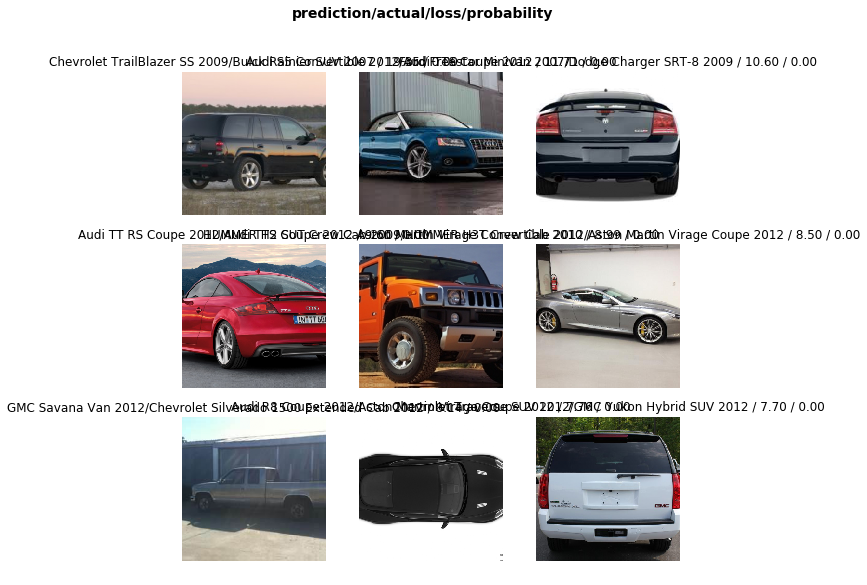

In [40]:
interp = ClassificationInterpretation.from_learner(learn)

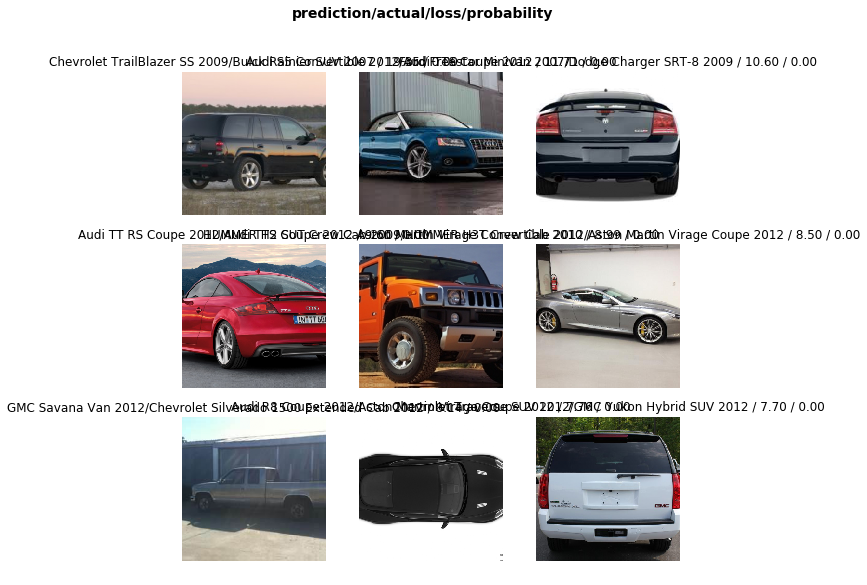

In [41]:
interp.plot_top_losses(9, figsize=(9,9))

In [42]:
most_confused = interp.most_confused()

('Chevrolet Express Van 2007', 'GMC Savana Van 2012', 5)


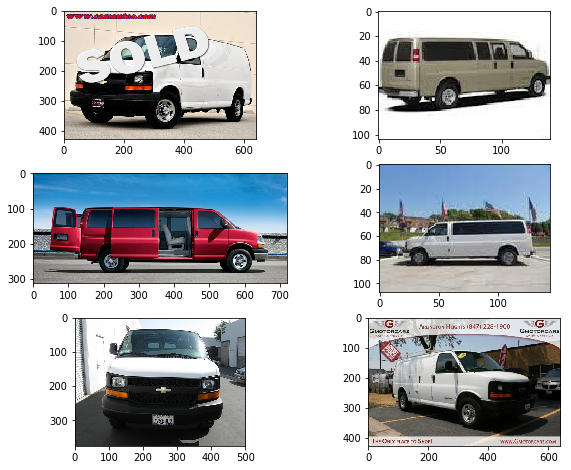

('Audi TT Hatchback 2011', 'Audi TTS Coupe 2012', 4)


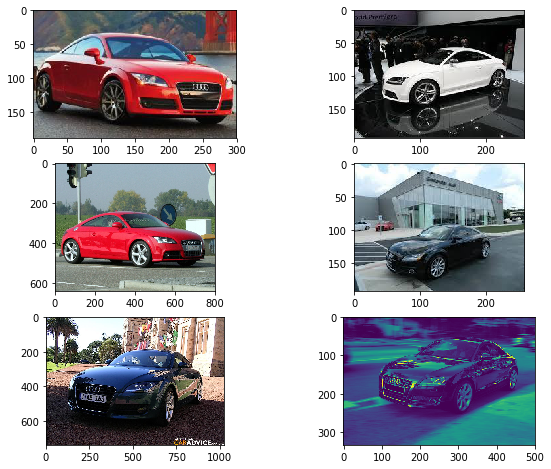

('Bentley Continental GT Coupe 2012', 'Bentley Continental GT Coupe 2007', 4)


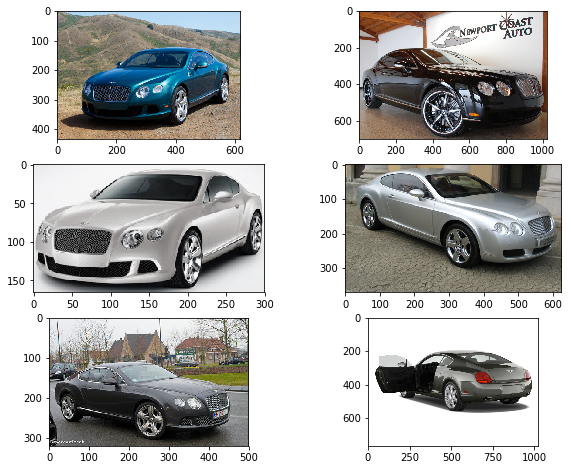

('Spyker C8 Convertible 2009', 'Spyker C8 Coupe 2009', 4)


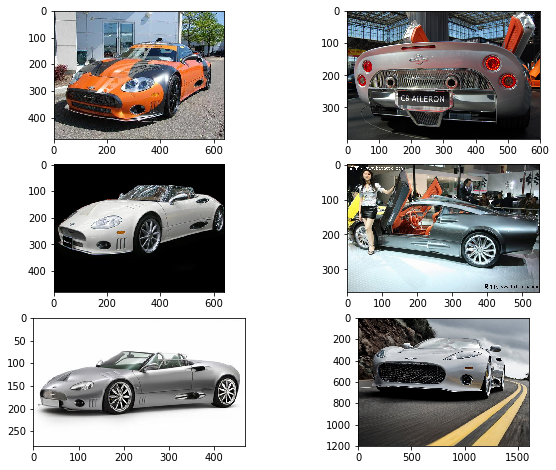

('Audi 100 Sedan 1994', 'Audi V8 Sedan 1994', 3)


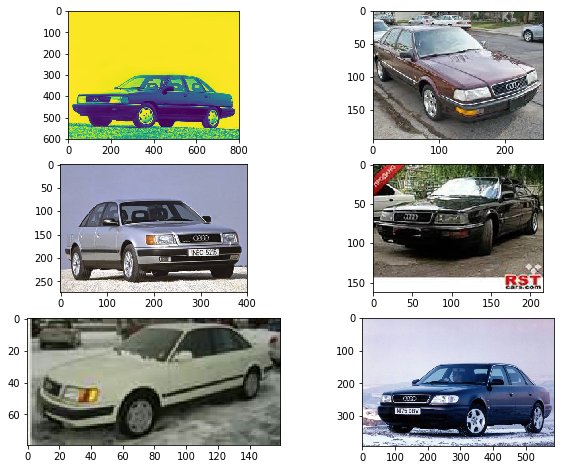

('Audi 100 Wagon 1994', 'Audi 100 Sedan 1994', 3)


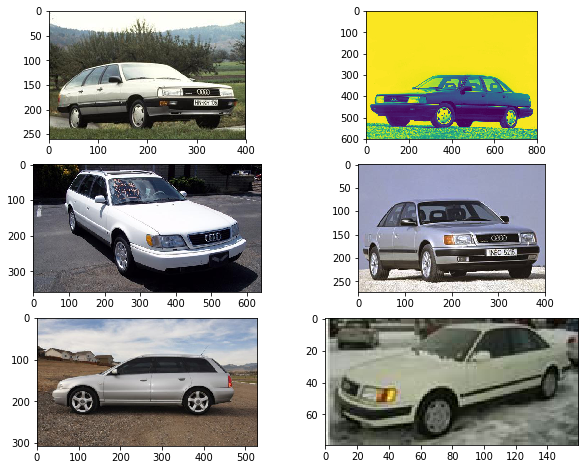

('Bugatti Veyron 16.4 Coupe 2009', 'Bugatti Veyron 16.4 Convertible 2009', 3)


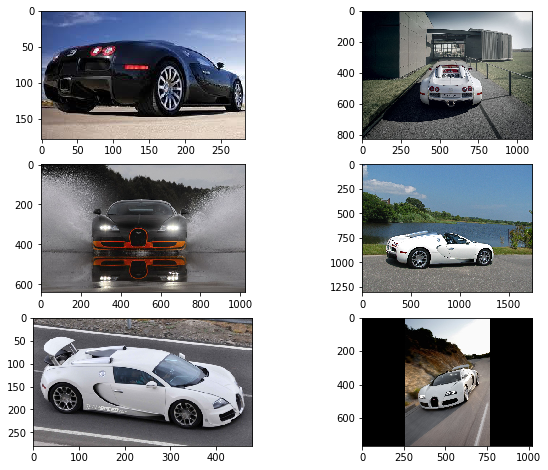

('Chevrolet Silverado 1500 Hybrid Crew Cab 2012', 'Chevrolet Silverado 1500 Extended Cab 2012', 3)


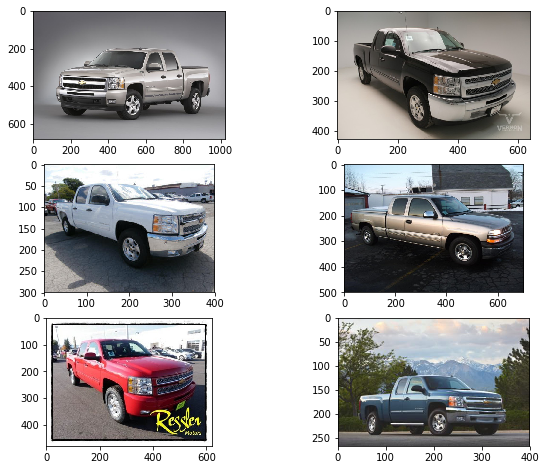

In [43]:
for i in range(0,8):
    compare_most_confused(most_confused=most_confused, path=path, labels_df=labels_df, 
                          num_imgs=3, rank=i)

Compare the classes with the top losses. Visualising the prediction-actual pairs can help understand where the model was getting it wrong

PREDICTION:Chevrolet TrailBlazer SS 2009, ACTUAL:Buick Rainier SUV 2007
Loss: 19.35, Probability: 0.0000


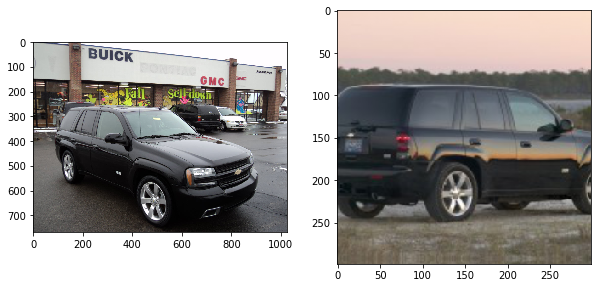

PREDICTION:Audi S5 Convertible 2012, ACTUAL:Audi TTS Coupe 2012
Loss: 11.71, Probability: 0.0000


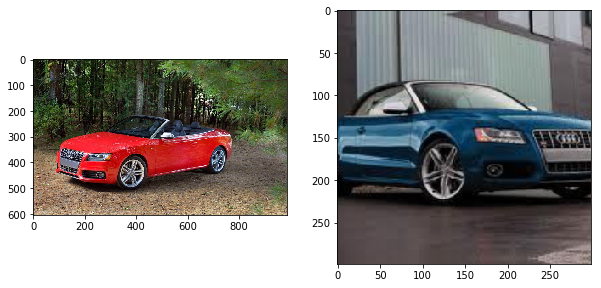

PREDICTION:Ford Freestar Minivan 2007, ACTUAL:Dodge Charger SRT-8 2009
Loss: 10.60, Probability: 0.0000


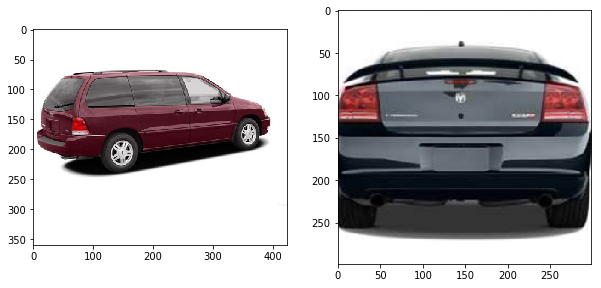

PREDICTION:Audi TT RS Coupe 2012, ACTUAL:Audi TTS Coupe 2012
Loss: 9.60, Probability: 0.0002


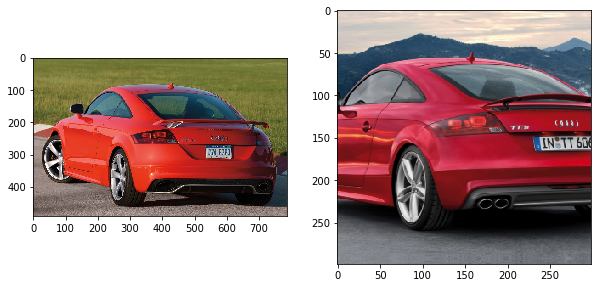

PREDICTION:HUMMER H2 SUT Crew Cab 2009, ACTUAL:HUMMER H3T Crew Cab 2010
Loss: 8.99, Probability: 0.0000


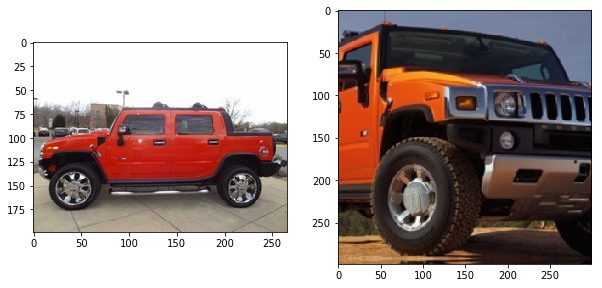

PREDICTION:Aston Martin Virage Convertible 2012, ACTUAL:Aston Martin Virage Coupe 2012
Loss: 8.50, Probability: 0.0000


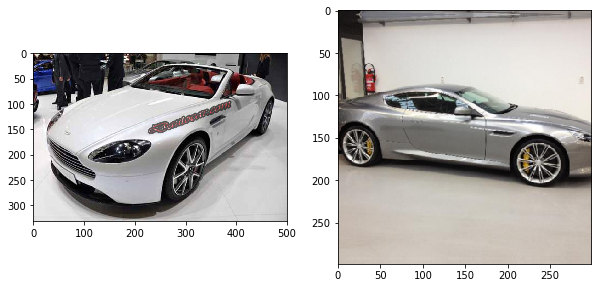

PREDICTION:GMC Savana Van 2012, ACTUAL:Chevrolet Silverado 1500 Extended Cab 2012
Loss: 8.14, Probability: 0.0000


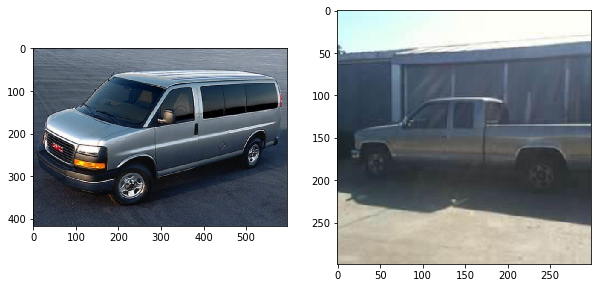

PREDICTION:Audi R8 Coupe 2012, ACTUAL:Aston Martin Virage Coupe 2012
Loss: 7.76, Probability: 0.0000


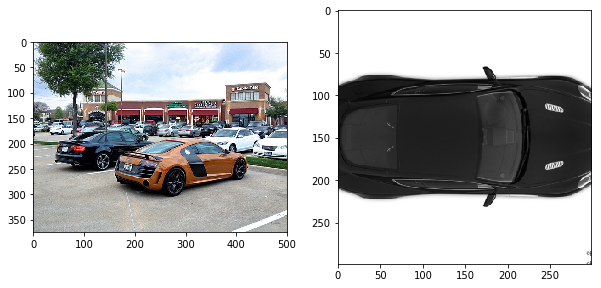

PREDICTION:Chevrolet Traverse SUV 2012, ACTUAL:GMC Yukon Hybrid SUV 2012
Loss: 7.70, Probability: 0.0000


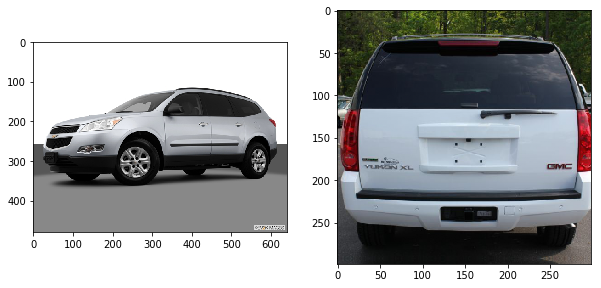

PREDICTION:Spyker C8 Coupe 2009, ACTUAL:Spyker C8 Convertible 2009
Loss: 7.68, Probability: 0.0000


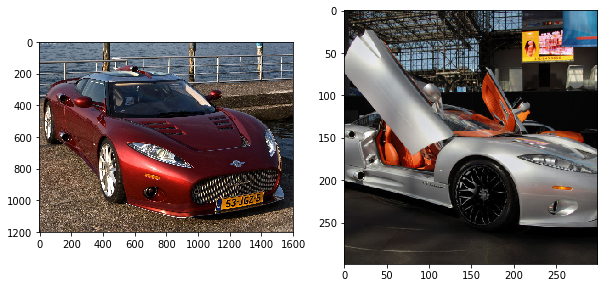

In [44]:
compare_top_losses(10, path, interp, labels_df, 1)

# Appendix - All Experiment Runs

### Stage-1

In [26]:
learn.fit_one_cycle(14, max_lr = lr)

epoch,train_loss,valid_loss,accuracy
1,4.228703,3.250902,0.261671
2,3.121493,3.178149,0.260442
3,3.119898,3.159432,0.254914
4,2.887271,3.656163,0.197789
5,2.466397,2.424449,0.394349
6,2.163700,1.952879,0.483415
7,1.860572,1.780360,0.528870
8,1.603416,1.588497,0.582310
9,1.281214,1.236984,0.659705
10,1.064075,0.902155,0.735258


In [27]:
learn.save('stage-1-rn152-high_lr')

In [20]:
#learn.load('stage-1-rn152-high_lr')

### Stage-1 - lr higher than suggested
`lr_find` might suggest using lr = 1e-2, lets use lr = 1e-1 with the 1-cycle policy. I'll also try a lower number of epochs as it might train faster with a higher lr.

In [25]:
lr = 1e-1

In [26]:
learn.fit_one_cycle(10, max_lr = lr)

epoch,train_loss,valid_loss,accuracy
1,4.987443,5.318952,0.033170
2,7.006456,7.243077,0.003686
3,9.976030,1107.675293,0.006143
4,11.184319,7.369863,0.004300
5,9.670415,68396.523438,0.003071
6,8.496552,6346.314453,0.003686
7,7.091276,3181.052490,0.005528
8,5.882599,223.694580,0.004914
9,5.475690,591.636658,0.005528
10,5.301158,585.099609,0.009828


In [27]:
learn.save('stage-1-rn152-high_lr_1e-1_10e')

#### Stage-1, using .fit

In [24]:
learn = create_cnn(data, arch, metrics=[accuracy])
lr = 1e-2
learn.fit(14, lr)

learn.save('stage-1-rn152-high_lr_fit')

epoch,train_loss,valid_loss,accuracy
1,5.341769,5.235789,0.007371
2,5.281330,5.164830,0.020270
3,5.276610,7.408267,0.012899
4,5.114186,10.981500,0.024570
5,4.963667,34.866528,0.030098
6,4.894552,9.538254,0.043612
7,4.839900,19.670437,0.038084
8,4.797734,10.815470,0.036241
9,4.611296,18.116730,0.072482
10,4.464778,21.340542,0.063268


#### Stage-1, using .fit

In [10]:
learn = create_cnn(data, arch, metrics=[accuracy])
lr = 1e-3
learn.fit(14, lr)

learn.save('stage-1-rn152-high_lr_fit_1e-3')

epoch,train_loss,valid_loss,accuracy
1,3.936152,2.971957,0.331081
2,2.624156,1.952502,0.535012
3,1.829045,1.400099,0.643120
4,1.430438,1.189776,0.699017
5,1.165748,1.032642,0.725430
6,0.937137,0.936512,0.739558
7,0.851764,0.938032,0.743243
8,0.760708,0.879104,0.759214
9,0.680729,0.851187,0.769042
10,0.649377,0.850226,0.762899


### Stage 2 - Trying Higher LRs for the unfrozen layers

Unfreezing all layers of the model will allow fine tuning of the earlier layers

In [28]:
learn.unfreeze()

Making the batch size smaller again as I encountered out of memory errors continuing with bs = 32

In [29]:
data.batch_size = 16
data.batch_size

16

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


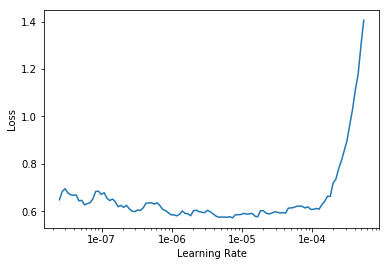

In [30]:
learn.lr_find(start_lr=1e-8, end_lr=9e-1, num_it=200)
learn.recorder.plot()

#### Stage-2, lr=1e-3, NO differential rates

In [22]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3

learn.fit_one_cycle(10, lr)

epoch,train_loss,valid_loss,accuracy
1,2.585514,3.056976,0.351351
2,3.918905,4.658844,0.178133
3,3.469486,3.831484,0.179361
4,2.505707,2.109059,0.469902
5,2.096717,2.173522,0.431204
6,1.726598,1.378018,0.630835
7,1.296852,1.071937,0.703931
8,1.071234,0.902192,0.755528
9,0.876271,0.792436,0.777641
10,0.757063,0.777670,0.784398


In [23]:
learn.save('stage-2-rn152-high_lr_no_diff_e10')

#### Stage-2, lr=1e-3, NO differential rates, 14 epochs

In [11]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3

learn.fit_one_cycle(14, lr)

learn.save('stage-2-rn152-high_lr_no_diff_e14')

epoch,train_loss,valid_loss,accuracy
1,2.052960,2.412553,0.448403
2,3.162754,3.455382,0.266585
3,3.318059,3.801925,0.221130
4,2.832741,2.855329,0.326781
5,2.311195,2.468332,0.373464
6,2.043912,1.832493,0.504300
7,1.683167,1.413593,0.619165
8,1.467877,1.191674,0.679361
9,1.140411,1.014116,0.718059
10,0.946554,0.870152,0.747543


#### Stage-2, lr=1e-3, NO differential rates, 16 epochs

In [12]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3

learn.fit_one_cycle(16, lr)

learn.save('stage-2-rn152-high_lr_no_diff_e16')

epoch,train_loss,valid_loss,accuracy
1,1.647928,2.400367,0.493243
2,2.927686,3.506353,0.302826
3,3.410174,3.558715,0.232801
4,2.892330,21.745432,0.310811
5,2.558381,2.814221,0.344595
6,2.115609,1.762498,0.528870
7,1.961503,1.849013,0.536241
8,1.591069,1.459328,0.595823
9,1.303086,1.153936,0.681818
10,1.146897,1.185914,0.710688


#### Stage-2, lr=1e-3, differential rates: [lr/100,lr/10,lr])

In [32]:
lr = 1e-3
lrs = np.array([lr/100,lr/10,lr])

The train and valid losses didn't really improve at this point using such a small lr

In [33]:
learn.fit_one_cycle(6, lrs)

epoch,train_loss,valid_loss,accuracy
1,1.130174,1.140192,0.687961
2,1.344882,1.166762,0.684889
3,1.111785,1.015320,0.722359
4,0.834074,0.763838,0.782555
5,0.575631,0.617449,0.824939
6,0.480937,0.604005,0.832924


In [34]:
learn.save('stage-2-rn152-high_lr_100')

#### Stage-2 lr=1e-3, differential rates: [lr/100,lr/10,lr]), 8 epochs

In [57]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(8, lrs)

epoch,train_loss,valid_loss,accuracy
1,0.825679,0.868560,0.767813
2,1.352893,1.264132,0.662776
3,1.415731,1.244390,0.671990
4,1.041084,0.910518,0.757371
5,0.797428,0.758208,0.780713
6,0.555254,0.641772,0.824324
7,0.447658,0.600881,0.826781
8,0.420616,0.593395,0.835381


In [58]:
learn.save('stage-2-rn152-high_lr_100_8e')

#### Stage-2, lr=1e-3, differential rates: [lr/100,lr/10,lr]), 10 epochs

In [11]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(10, lrs)

epoch,train_loss,valid_loss,accuracy
1,0.679794,0.798548,0.777641
2,1.289161,1.257854,0.663391
3,1.430835,1.296746,0.662776
4,1.137190,1.072863,0.704545
5,1.030550,0.891423,0.754914
6,0.749431,0.755284,0.796069
7,0.603601,0.673306,0.815111
8,0.483286,0.609208,0.831695
9,0.385432,0.560437,0.842138
10,0.318791,0.549210,0.847052


In [13]:
learn.save('stage-2-rn152-high_lr_100_10e')

#### Stage-2, lr=1e-3, differential rates: [lr/100,lr/10,lr]), 12 epochs

In [10]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(12, lrs)

epoch,train_loss,valid_loss,accuracy
1,0.793611,0.776675,0.784398
2,1.078946,0.985019,0.726044
3,1.320270,1.293277,0.653563
4,1.250505,1.154597,0.697789
5,1.060971,0.961850,0.724816
6,0.970896,0.854178,0.762285
7,0.727404,0.711070,0.796069
8,0.594634,0.633422,0.820639
9,0.541203,0.598027,0.828624
10,0.369853,0.551615,0.838452


In [11]:
learn.save('stage-2-rn152-high_lr_100_12e')

#### Stage-2, lr=1e-3, differential rates: [lr/100,lr/10,lr]), 13 epochs

In [26]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(13, lr)

learn.save('stage-2-rn152-high_lr_100_e13')

epoch,train_loss,valid_loss,accuracy
1,0.679739,0.780595,0.786241
2,1.124752,1.060926,0.716830
3,1.286560,1.225858,0.670762
4,1.257262,1.054813,0.711916
5,1.058145,1.048358,0.708231
6,1.042759,0.885570,0.753071
7,0.826022,0.778443,0.783784
8,0.621803,0.690244,0.813268
9,0.512493,0.608917,0.829853
10,0.409590,0.574463,0.835995


#### Stage-2, lr=1e-3, differential rates: [lr/100,lr/10,lr]), 14 epochs

In [19]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(14, lrs)

epoch,train_loss,valid_loss,accuracy
1,0.681891,0.784587,0.777027
2,1.043527,0.988674,0.737715
3,1.263955,1.314311,0.652334
4,1.203717,1.068390,0.692875
5,1.122097,1.046142,0.711916
6,1.016265,0.816316,0.761671
7,0.808969,0.773906,0.786241
8,0.668154,0.755319,0.784398
9,0.528003,0.663211,0.818182
10,0.429401,0.625269,0.827396


In [20]:
learn.save('stage-2-rn152-high_lr_100_14e')

#### Stage-2, lr=1e-2, differential rates: [lr/100,lr/10,lr]), 6 epochs

In [45]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-2
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(6, lrs)

epoch,train_loss,valid_loss,accuracy
1,3.108206,3.531412,0.205160
2,3.329442,4.128119,0.154791
3,2.902983,4.182389,0.364865
4,2.417334,1.681622,0.554054
5,1.460143,1.083511,0.705774
6,1.112470,1.023167,0.730958


In [46]:
learn.save('stage-2-rn152-high_lr_100_1e-2')

#### Stage-2, lr=1e-2, differential rates: [lr/100,lr/10,lr]), 8 epochs

In [47]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-2
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(8, lrs)

epoch,train_loss,valid_loss,accuracy
1,2.583997,3.349519,0.262899
2,3.854593,6.895114,0.038084
3,3.157084,3.352454,0.237715
4,2.680824,2.096192,0.442875
5,2.102074,1.568491,0.580467
6,1.529632,1.102805,0.703317
7,1.123258,0.882384,0.759214
8,0.934262,0.848440,0.764128


In [48]:
learn.save('stage-2-rn152-high_lr_100_1e-2_8e')

#### Stage-2, lr=1e-2, differential rates: [lr/100,lr/10,lr]), 12 epochs

In [12]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-2
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(12, lrs)

epoch,train_loss,valid_loss,accuracy
1,2.020689,1.771695,0.548526
2,2.711458,4.252786,0.218059
3,3.074888,3.392356,0.256757
4,3.474121,20.965473,0.015356
5,4.236302,88.840660,0.160934
6,2.964021,36.174767,0.350123
7,2.551352,4.086349,0.498771
8,2.009317,5.189732,0.582924
9,1.627497,143.658875,0.643120
10,1.280107,2.634746,0.696560


In [13]:
learn.save('stage-2-rn152-high_lr_100_1e-2_12e')

#### Stage-2, lr=1e-3, differential rates: [lr/9,lr/3,lr]), 6 epochs

In [35]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3
lrs = np.array([lr/9,lr/3,lr])

learn.fit_one_cycle(6, lrs)

epoch,train_loss,valid_loss,accuracy
1,2.208666,2.805307,0.386978
2,2.328057,1.815004,0.520885
3,1.711332,1.343535,0.643735
4,1.250285,0.968026,0.724816
5,0.828662,0.718699,0.807125
6,0.653454,0.677751,0.812654


In [40]:
learn.save('stage-2-rn152-high_lr_9')

#### Stage-2, lr=1e-3, differential rates: [lr/9,lr/3,lr]), 8 epochs

In [41]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3
lrs = np.array([lr/9,lr/3,lr])

learn.fit_one_cycle(8, lrs)

epoch,train_loss,valid_loss,accuracy
1,1.504027,1.799448,0.562039
2,2.253084,2.214012,0.450860
3,2.216896,1.583165,0.575553
4,1.570231,1.252248,0.659705
5,1.229809,1.055323,0.718673
6,0.892833,0.772617,0.781327
7,0.667072,0.651086,0.809582
8,0.568647,0.639575,0.817568


In [42]:
learn.save('stage-2-rn152-high_lr_9_8e')

#### Stage-2, lr=1e-3, differential rates: [lr/9,lr/3,lr]), 10 epochs

In [55]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3
lrs = np.array([lr/9,lr/3,lr])

learn.fit_one_cycle(10, lrs)

epoch,train_loss,valid_loss,accuracy
1,1.250748,1.339578,0.649263
2,2.123658,2.503381,0.414619
3,1.999475,1.945923,0.513514
4,1.676277,1.549081,0.580467
5,1.417099,1.271769,0.649877
6,1.110196,1.037833,0.721130
7,0.908864,0.852554,0.765971
8,0.664609,1.041604,0.800369
9,0.515681,0.847699,0.813882
10,0.494087,0.669149,0.825553


In [56]:
learn.save('stage-2-rn152-high_lr_9_10e')

#### Stage-2, lr=1e-3, differential rates: [lr/9,lr/3,lr]), 12 epochs

In [14]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3
lrs = np.array([lr/9,lr/3,lr])

learn.fit_one_cycle(12, lrs)

epoch,train_loss,valid_loss,accuracy
1,1.111268,1.185850,0.675676
2,1.862865,1.877336,0.516585
3,2.007227,1.849862,0.525798
4,1.710655,1.626170,0.563268
5,1.581131,1.264061,0.657862
6,1.302855,1.161976,0.712531
7,1.046626,0.935418,0.741400
8,0.822390,0.854299,0.766585
9,0.635411,0.961340,0.797297
10,0.494297,0.748128,0.800369


In [15]:
learn.save('stage-2-rn152-high_lr_9_12e')

#### Stage-2, lr=1e-3, differential rates: [lr/9,lr/3,lr]), 14 epochs

In [16]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3
lrs = np.array([lr/9,lr/3,lr])

learn.fit_one_cycle(14, lrs)

epoch,train_loss,valid_loss,accuracy
1,1.081320,1.140888,0.702703
2,1.783688,1.973320,0.521499
3,2.071386,1.941408,0.519656
4,2.013211,1.845252,0.527027
5,1.606956,1.445679,0.616093
6,1.405345,1.080066,0.697789
7,1.192511,1.052464,0.726658
8,1.022240,0.887957,0.751229
9,0.778355,0.766086,0.776413
10,0.638298,0.695060,0.802211


In [17]:
learn.save('stage-2-rn152-high_lr_9_14e')

#### Stage-2, lr=1e-2, differential rates: [lr/9,lr/3,lr]), 8 epochs

In [49]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-2
lrs = np.array([lr/9,lr/3,lr])

learn.fit_one_cycle(8, lrs)

epoch,train_loss,valid_loss,accuracy
1,4.043413,4.388168,0.129607
2,4.971026,5.391483,0.014742
3,5.406874,7.449218,0.006757
4,5.446515,9.661489,0.004300
5,5.310535,64.250816,0.011671
6,5.253862,5.512072,0.011057
7,5.174304,5.641173,0.016585
8,5.126043,8.545300,0.014128


In [50]:
learn.save('stage-2-rn152-high_lr_9_10e')

#### Stage-2, lr=1e-2, differential rates: [lr/9,lr/3,lr]), 12 epochs

In [51]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-2
lrs = np.array([lr/9,lr/3,lr])

learn.fit_one_cycle(12, lrs)

epoch,train_loss,valid_loss,accuracy
1,3.175111,3.574424,0.251843
2,3.587363,4.677711,0.100737
3,4.143873,4.452847,0.082924
4,5.026912,5.264611,0.029484
5,4.968291,386.725800,0.008600
6,4.880498,12.056993,0.040541
7,4.627178,20.797712,0.075553
8,4.148568,86.775284,0.119779
9,3.766831,4.151948,0.226658
10,3.332452,4.857905,0.308968


In [52]:
learn.save('stage-2-rn152-high_lr_9_12e')

#### Stage-2, lr=1e-3, 10 epochs, `.fit` only

In [ ]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3

learn.fit(10, lr)

### Stage-2, Retrain using the Unfrozen Winner!

In [13]:
# Testing with higher LR and unfrozen layers
learn.load('stage-1-rn152-high_lr')
learn.unfreeze()
data.batch_size = 16

lr = 1e-3
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(12, lrs)

learn.save('stage-2-rn152-high_lr_100_e12')

epoch,train_loss,valid_loss,accuracy
1,0.672039,0.781260,0.787469
2,1.065357,1.038464,0.708845
3,1.306707,1.149271,0.691646
4,1.239505,1.103928,0.697174
5,1.013107,0.931272,0.743243
6,0.893125,0.820169,0.773342
7,0.696432,0.743721,0.783784
8,0.575754,0.661576,0.821253
9,0.492879,0.617049,0.823096
10,0.360245,0.574838,0.832310


In [14]:
learn.load('stage-2-rn152-high_lr_100_e12')

Learner(data=ImageDataBunch;

Train: LabelList
y: CategoryList (6516 items)
[Category Audi TTS Coupe 2012, Category Acura TL Sedan 2012, Category Dodge Dakota Club Cab 2007, Category Hyundai Sonata Hybrid Sedan 2012, Category Ford F-450 Super Duty Crew Cab 2012]...
Path: data/stanford-cars
x: ImageItemList (6516 items)
[Image (3, 400, 600), Image (3, 675, 900), Image (3, 480, 640), Image (3, 1386, 2100), Image (3, 108, 144)]...
Path: data/stanford-cars;

Valid: LabelList
y: CategoryList (1628 items)
[Category Plymouth Neon Coupe 1999, Category Honda Odyssey Minivan 2012, Category Aston Martin Virage Convertible 2012, Category Fisker Karma Sedan 2012, Category Audi S6 Sedan 2011]...
Path: data/stanford-cars
x: ImageItemList (1628 items)
[Image (3, 759, 1012), Image (3, 338, 600), Image (3, 418, 628), Image (3, 768, 1024), Image (3, 1575, 2100)]...
Path: data/stanford-cars;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding

### Stage 3 - Freeze the model, resize the images

Resize the dataset, freeze the earlier layers again and continue learning.

In [10]:
SZ = 299
SEED = 42
LABEL = 'class_name'

car_tfms = get_transforms()

data = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))

data.batch_size = 16

print(data.batch_size)
data.train_ds[0][0].shape

16


torch.Size([3, 299, 299])

In [16]:
learn.data = data

In [17]:
learn.freeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


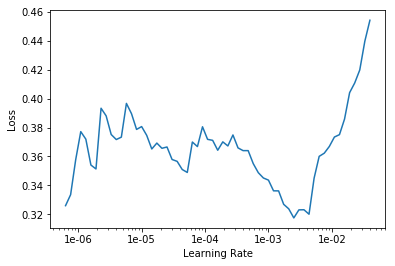

In [18]:
learn.lr_find()
learn.recorder.plot()

#### Stage-3, lr=5e-4, 5 epochs

In [19]:
lr=5e-4

In [20]:
learn.fit_one_cycle(5, max_lr = lr)

epoch,train_loss,valid_loss,accuracy
1,0.341407,0.520684,0.848280
2,0.270751,0.480724,0.860565
3,0.259749,0.469882,0.864251
4,0.258787,0.471349,0.871007
5,0.264387,0.468506,0.865479


Neither the train or validation loss are really improving here, lets see if unfreezing and training all the layers will help

In [21]:
learn.save('stage-3-rn152-high_lr_e5')

#### Stage-3, lr=5e-4, 3 epochs

In [22]:
# Testing with higher LR and unfrozen layers
learn.load('stage-2-rn152-high_lr_100_e12')
learn.freeze()
data.batch_size = 16

lr=5e-4

learn.fit_one_cycle(3, lr)

learn.save('stage-3-rn152-high_lr_3e')

epoch,train_loss,valid_loss,accuracy
1,0.347847,0.514084,0.853194
2,0.279301,0.484722,0.859337
3,0.250901,0.487881,0.856880


#### Stage-3, lr=1e-3, 3 epochs

In [24]:
# Testing with higher LR and unfrozen layers
learn.load('stage-2-rn152-high_lr_100_e12')
learn.freeze()
data.batch_size = 16

lr=1e-3

learn.fit_one_cycle(3, lr)

learn.save('stage-3-rn152-high_lr_1e-3_3e')

epoch,train_loss,valid_loss,accuracy
1,0.310974,0.521306,0.850737
2,0.276097,0.495395,0.858722
3,0.247004,0.493049,0.857494


#### Stage-3, lr=1e-3, 5 epochs

In [25]:
# Testing with higher LR and unfrozen layers
learn.load('stage-2-rn152-high_lr_100_e12')
learn.freeze()
data.batch_size = 16

lr=1e-3

learn.fit_one_cycle(5, lr)

learn.save('stage-3-rn152-high_lr_1e-3_5e')

epoch,train_loss,valid_loss,accuracy
1,0.333064,0.496331,0.856265
2,0.317838,0.490419,0.858108
3,0.295617,0.482664,0.861794
4,0.234280,0.474644,0.866708
5,0.228294,0.468558,0.875921


#### Stage-3, lr=1e-3, 7 epochs

In [26]:
# Testing with higher LR and unfrozen layers
learn.load('stage-2-rn152-high_lr_100_e12')
learn.freeze()
data.batch_size = 16

lr=1e-3

learn.fit_one_cycle(7, lr)

learn.save('stage-3-rn152-high_lr_1e-3_7e')

epoch,train_loss,valid_loss,accuracy
1,0.354648,0.505756,0.853808
2,0.314856,0.504504,0.862408
3,0.276418,0.498576,0.863022
4,0.266934,0.492155,0.858722
5,0.218478,0.481649,0.860565
6,0.190553,0.476171,0.864865
7,0.198982,0.473183,0.873464


#### Stage-3, lr=1e-3, 9 epochs

In [28]:
# Testing with higher LR and unfrozen layers
learn.load('stage-2-rn152-high_lr_100_e12')
learn.freeze()
data.batch_size = 16

lr=1e-3

learn.fit_one_cycle(9, lr)

learn.save('stage-3-rn152-high_lr_1e-3_9e')

epoch,train_loss,valid_loss,accuracy
1,0.361851,0.514065,0.849509
2,0.300739,0.508011,0.856265
3,0.320830,0.513624,0.850737
4,0.297530,0.487939,0.863636
5,0.251748,0.487435,0.865479
6,0.220443,0.477691,0.866093
7,0.206842,0.472591,0.872236
8,0.194167,0.469476,0.872236
9,0.183483,0.472655,0.869779


#### Stage-3, lr=5e-4, 1 epochs

In [25]:
# Testing with higher LR and unfrozen layers
learn.load('stage-2-rn152-high_lr_100_10e')
learn.freeze()
data.batch_size = 16

lr=5e-4

learn.fit_one_cycle(1, lr)

epoch,train_loss,valid_loss,accuracy
1,0.380814,0.515267,0.855651


In [26]:
learn.save('stage-3-rn152-high_lr_1e')

#### Stage-3, lr=5e-4, 3 epochs

In [ ]:
# Testing with higher LR and unfrozen layers
learn.load('stage-2-rn152-high_lr_100_10e')
learn.freeze()
data.batch_size = 16

lr=5e-4

learn.fit_one_cycle(3, lr)

In [ ]:
learn.save('stage-3-rn152-high_lr_3e')

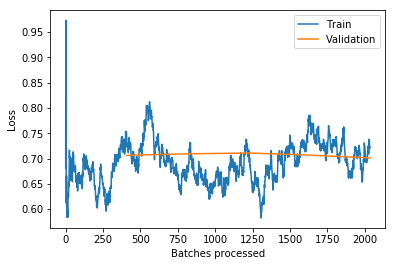

In [33]:
learn.recorder.plot_losses()

#### Stage 4 - Unfreeze Again
Using 'stage-3-rn152-high_lr_1e-3_5e'

Again, unfreeze all layers and tune them...

In [9]:
data.batch_size

32

In [10]:
data.batch_size = 16
print(data.batch_size)

learn = create_cnn(data, arch, metrics=[accuracy])

learn.load('stage-3-rn152-high_lr_1e-3_5e')

16


Learner(data=ImageDataBunch;

Train: LabelList
y: CategoryList (6516 items)
[Category Audi TTS Coupe 2012, Category Acura TL Sedan 2012, Category Dodge Dakota Club Cab 2007, Category Hyundai Sonata Hybrid Sedan 2012, Category Ford F-450 Super Duty Crew Cab 2012]...
Path: data/stanford-cars
x: ImageItemList (6516 items)
[Image (3, 400, 600), Image (3, 675, 900), Image (3, 480, 640), Image (3, 1386, 2100), Image (3, 108, 144)]...
Path: data/stanford-cars;

Valid: LabelList
y: CategoryList (1628 items)
[Category Plymouth Neon Coupe 1999, Category Honda Odyssey Minivan 2012, Category Aston Martin Virage Convertible 2012, Category Fisker Karma Sedan 2012, Category Audi S6 Sedan 2011]...
Path: data/stanford-cars
x: ImageItemList (1628 items)
[Image (3, 759, 1012), Image (3, 338, 600), Image (3, 418, 628), Image (3, 768, 1024), Image (3, 1575, 2100)]...
Path: data/stanford-cars;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding

In [11]:
learn.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


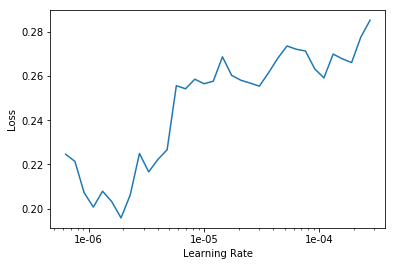

In [12]:
learn.lr_find()
learn.recorder.plot()

#### Stage-4, lr=1e-3,[lr/100,lr/10,lr], 5 epochs

In [13]:
lr = 1e-3
lrs = np.array([lr/100,lr/10,lr])

In [14]:
learn.fit_one_cycle(5, lrs)
learn.save('stage-4-rn152-high_lr_100_1e-3_5e')

epoch,train_loss,valid_loss,accuracy
1,0.484408,0.718355,0.799754
2,0.700074,0.759174,0.792383
3,0.565211,0.698442,0.813268
4,0.423997,0.571508,0.845209
5,0.293753,0.546489,0.849509


#### Stage-4, lr=1e-3, [lr/100,lr/10,lr], 7 epochs

In [21]:
# Testing with higher LR and unfrozen layers
learn.load('stage-3-rn152-high_lr_1e-3_5e')
learn.unfreeze()
data.batch_size = 16
learn.data = data

lr=1e-3
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(7, lrs)
learn.save('stage-4-rn152-high_lr_100_1e-3_7e')

epoch,train_loss,valid_loss,accuracy
1,0.355910,0.640707,0.826781
2,0.660549,0.897322,0.755528
3,0.684334,0.802772,0.791769
4,0.527012,0.742859,0.805283
5,0.412346,0.617186,0.821867
6,0.248804,0.558399,0.847666
7,0.238398,0.550514,0.848894


#### Stage-4, lr=1e-3, [lr/100,lr/10,lr], 9 epochs

In [16]:
# Testing with higher LR and unfrozen layers
learn.load('stage-3-rn152-high_lr_1e-3_5e')
learn.unfreeze()
data.batch_size = 16
learn.data = data

lr=1e-3
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(9, lrs)
learn.save('stage-4-rn152-high_lr_100_1e-3_9e')

epoch,train_loss,valid_loss,accuracy
1,0.307693,0.606940,0.843366
2,0.642977,0.783034,0.782555
3,0.718971,0.893226,0.772727
4,0.656453,0.808346,0.796069
5,0.527491,0.701778,0.811425
6,0.381970,0.611257,0.830467
7,0.313622,0.568639,0.847666
8,0.260211,0.528604,0.852580
9,0.233453,0.544681,0.850123


In [23]:
# Testing with higher LR and unfrozen layers
learn.load('stage-3-rn152-high_lr_1e-3_5e')
learn.unfreeze()
data.batch_size = 16
learn.data = data

lr=5e-4
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(5, lrs)
learn.save('stage-4-rn152-high_lr_100_5e-4_5e')

epoch,train_loss,valid_loss,accuracy
1,0.370095,0.607895,0.834767
2,0.427123,0.642683,0.829238
3,0.360316,0.599720,0.846437
4,0.256657,0.549392,0.855651
5,0.240663,0.547013,0.858722


In [25]:
# Testing with higher LR and unfrozen layers
learn.load('stage-3-rn152-high_lr_1e-3_5e')
learn.unfreeze()
data.batch_size = 16
learn.data = data

lr=5e-4
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(7, lrs)
learn.save('stage-4-rn152-high_lr_100_5e-4_7e')

epoch,train_loss,valid_loss,accuracy
1,0.274106,0.589533,0.841523
2,0.417677,0.694621,0.811425
3,0.450084,0.653462,0.826167
4,0.365477,0.621424,0.839681
5,0.286345,0.567882,0.848894
6,0.244055,0.555211,0.850737
7,0.187996,0.547240,0.848894


#### Stage-3, lr=1e-4, [lr/100,lr/10,lr], 5 epochs

In [15]:
# Testing with higher LR and unfrozen layers
learn.load('stage-3-rn152-high_lr_1e-3_5e')
learn.unfreeze()
data.batch_size = 16
learn.data = data

lr=1e-4
lrs = np.array([lr/100,lr/10,lr])

learn.fit_one_cycle(5, lrs)
learn.save('stage-4-rn152-high_lr_100_1e-4_5e')

epoch,train_loss,valid_loss,accuracy
1,0.290539,0.576300,0.841523
2,0.273922,0.558272,0.848280
3,0.282371,0.550775,0.845823
4,0.239868,0.550447,0.850123
5,0.223384,0.542069,0.850737


#### Stage-4, lr=1e-4, [lr/9,lr/3,lr], 5 epochs

In [18]:
# Testing with higher LR and unfrozen layers
learn.load('stage-3-rn152-high_lr_1e-3_5e')
learn.unfreeze()
data.batch_size = 16
learn.data = data

lr=1e-4
lrs = np.array([lr/9,lr/3,lr])

learn.fit_one_cycle(5, lrs)
learn.save('stage-4-rn152-high_lr_9_1e-4_5e')

epoch,train_loss,valid_loss,accuracy
1,0.287514,0.579488,0.843980
2,0.325166,0.589772,0.840909
3,0.288398,0.557133,0.847052
4,0.248031,0.539888,0.853808
5,0.245733,0.531973,0.856265


#### Stage-4, lr=1e-4, [lr/9,lr/3,lr], 7 epochs

In [19]:
# Testing with higher LR and unfrozen layers
learn.load('stage-3-rn152-high_lr_1e-3_5e')
learn.unfreeze()
data.batch_size = 16
learn.data = data

lr=1e-4
lrs = np.array([lr/9,lr/3,lr])

learn.fit_one_cycle(7, lrs)
learn.save('stage-4-rn152-high_lr_9_1e-4_7e')

epoch,train_loss,valid_loss,accuracy
1,0.288457,0.573890,0.844595
2,0.343814,0.610549,0.834152
3,0.352705,0.582425,0.845823
4,0.321707,0.567637,0.854423
5,0.259475,0.546904,0.851966
6,0.211558,0.540307,0.855037
7,0.199112,0.527199,0.858722


#### Stage-4, lr=1e-4, [lr/9,lr/3,lr], 9 epochs

In [20]:
# Testing with higher LR and unfrozen layers
learn.load('stage-3-rn152-high_lr_1e-3_5e')
learn.unfreeze()
data.batch_size = 16
learn.data = data

lr=1e-4
lrs = np.array([lr/9,lr/3,lr])

learn.fit_one_cycle(9, lrs)
learn.save('stage-4-rn152-high_lr_9_1e-4_9e')

epoch,train_loss,valid_loss,accuracy
1,0.260532,0.565073,0.843366
2,0.310720,0.587634,0.835995
3,0.330052,0.598817,0.828010
4,0.326022,0.609692,0.833538
5,0.316547,0.569609,0.843366
6,0.246763,0.558922,0.855651
7,0.216138,0.541415,0.856265
8,0.177501,0.541422,0.855651
9,0.209612,0.535233,0.855037


#### Stage-4, lr=1e-5, [lr/9,lr/3,lr], 5 epochs

In [22]:
# Testing with higher LR and unfrozen layers
learn.load('stage-3-rn152-high_lr_1e-3_5e')
learn.unfreeze()
data.batch_size = 16
learn.data = data

lr=1e-5
lrs = np.array([lr/9,lr/3,lr])

learn.fit_one_cycle(5, lrs)
learn.save('stage-4-rn152-high_lr_9_1e-5_5e')

epoch,train_loss,valid_loss,accuracy
1,0.296796,0.570521,0.841523
2,0.258889,0.554971,0.850737
3,0.270113,0.556398,0.850123
4,0.248696,0.556699,0.845823
5,0.258473,0.547980,0.850737


#### Stage-4, lr=1e-6, [lr/9,lr/3,lr], 5 epochs

In [24]:
# Testing with higher LR and unfrozen layers
learn.load('stage-3-rn152-high_lr_1e-3_5e')
learn.unfreeze()
data.batch_size = 16
learn.data = data

lr=1e-6
lrs = np.array([lr/9,lr/3,lr])

learn.fit_one_cycle(5, lrs)
learn.save('stage-4-rn152-high_lr_9_1e-6_5e')

epoch,train_loss,valid_loss,accuracy
1,0.287866,0.588839,0.837224
2,0.283951,0.582915,0.845209
3,0.274084,0.574046,0.844595
4,0.285738,0.575444,0.842752
5,0.251508,0.571805,0.840909


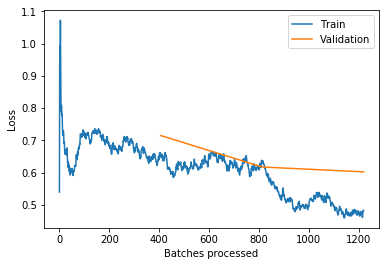

In [42]:
learn.recorder.plot_losses()

Model is starting to overfit here to lets finish here with our training, time to see some results!

In [ ]:
learn.freeze()

In [43]:
learn.save('stage-4-rn152-high_lr')

In [21]:
#learn.load('stage-4-rn152-high_lr')

## Results

Lets interpret the performance, where did the model do poorly? The `plot_top_losses` method doesn't print nicely here as I have used the car model names instead of car ids. A couple of custom functions used below (`compare_most_confused` and `compare_top_losses` help us better see where the model was going wrong.

#### Test with the best performing model: Stage-3 model with lr=1e-3 and 5epochs

In [29]:
# Make sure we are using the correct data for the dataset:
SZ = 299
SEED = 42
LABEL = 'class_name'

car_tfms = get_transforms()

data = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))

data.batch_size = 16

learn = create_cnn(data, arch, metrics=[accuracy])
learn.load('stage-3-rn152-high_lr_1e-3_5e')

Learner(data=ImageDataBunch;

Train: LabelList
y: CategoryList (6516 items)
[Category Audi TTS Coupe 2012, Category Acura TL Sedan 2012, Category Dodge Dakota Club Cab 2007, Category Hyundai Sonata Hybrid Sedan 2012, Category Ford F-450 Super Duty Crew Cab 2012]...
Path: data/stanford-cars
x: ImageItemList (6516 items)
[Image (3, 400, 600), Image (3, 675, 900), Image (3, 480, 640), Image (3, 1386, 2100), Image (3, 108, 144)]...
Path: data/stanford-cars;

Valid: LabelList
y: CategoryList (1628 items)
[Category Plymouth Neon Coupe 1999, Category Honda Odyssey Minivan 2012, Category Aston Martin Virage Convertible 2012, Category Fisker Karma Sedan 2012, Category Audi S6 Sedan 2011]...
Path: data/stanford-cars
x: ImageItemList (1628 items)
[Image (3, 759, 1012), Image (3, 338, 600), Image (3, 418, 628), Image (3, 768, 1024), Image (3, 1575, 2100)]...
Path: data/stanford-cars;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding

#### Test with best Stage-4 model for comparison

In [10]:
# Make sure we are using the correct data for the dataset:
SZ = 299
SEED = 42
LABEL = 'class_name'

car_tfms = get_transforms()

data = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))

data.batch_size = 16

learn = create_cnn(data, arch, metrics=[accuracy])
learn.load('stage-4-rn152-high_lr_100_5e-4_5e')

Learner(data=ImageDataBunch;

Train: LabelList
y: CategoryList (6516 items)
[Category Audi TTS Coupe 2012, Category Acura TL Sedan 2012, Category Dodge Dakota Club Cab 2007, Category Hyundai Sonata Hybrid Sedan 2012, Category Ford F-450 Super Duty Crew Cab 2012]...
Path: data/stanford-cars
x: ImageItemList (6516 items)
[Image (3, 400, 600), Image (3, 675, 900), Image (3, 480, 640), Image (3, 1386, 2100), Image (3, 108, 144)]...
Path: data/stanford-cars;

Valid: LabelList
y: CategoryList (1628 items)
[Category Plymouth Neon Coupe 1999, Category Honda Odyssey Minivan 2012, Category Aston Martin Virage Convertible 2012, Category Fisker Karma Sedan 2012, Category Audi S6 Sedan 2011]...
Path: data/stanford-cars
x: ImageItemList (1628 items)
[Image (3, 759, 1012), Image (3, 338, 600), Image (3, 418, 628), Image (3, 768, 1024), Image (3, 1575, 2100)]...
Path: data/stanford-cars;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding

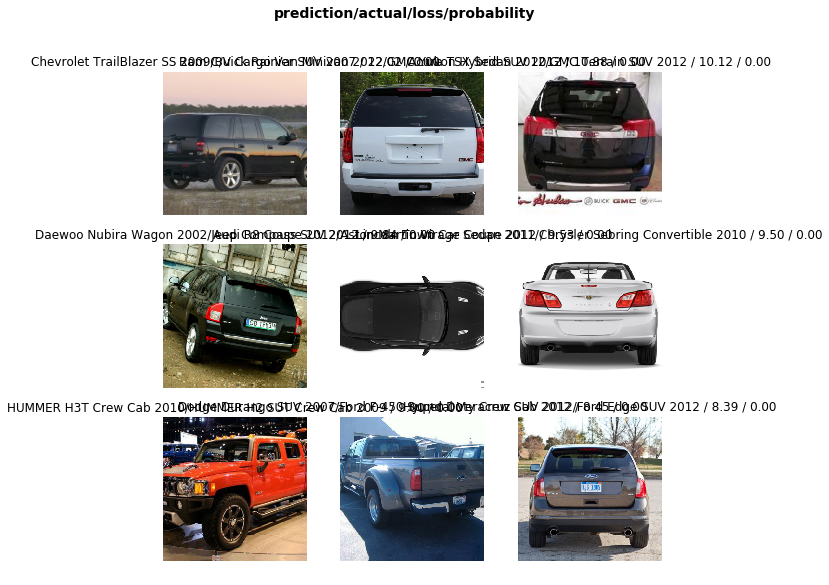

In [30]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(9, figsize=(9,9))

Lets look at the most confused images. Visualising a number of samples from each of the confused classes can help see how our model is doing. Here we can see the model was getting confused between **very similar car models**, often just between different model years, if you're not into cars you would have to look closely to notice the differences!

I think it is super cool to see how the model confuses such similar car models. If we didn't care about the model year then aggregating the same car models of different years would likely give an even better accuracy score.

In [31]:
most_confused = interp.most_confused()

In [35]:
%autoreload

('Bugatti Veyron 16.4 Coupe 2009', 'Bugatti Veyron 16.4 Convertible 2009', 5)


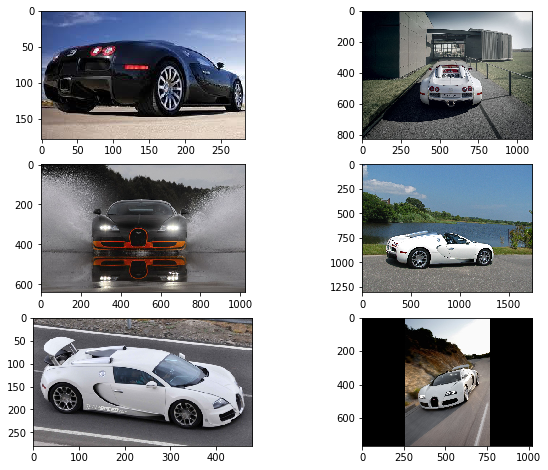

('Chevrolet Express Van 2007', 'GMC Savana Van 2012', 5)


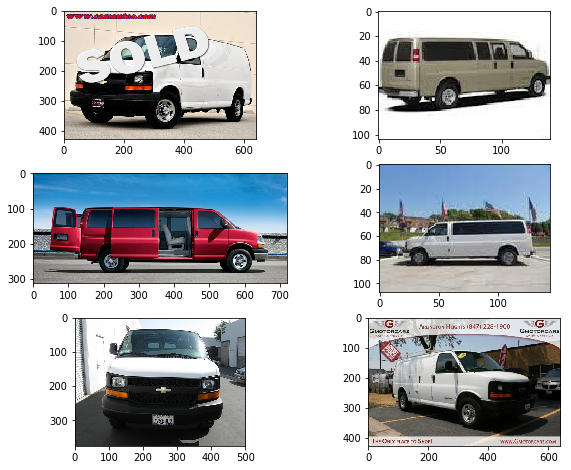

('Bentley Continental GT Coupe 2012', 'Bentley Continental GT Coupe 2007', 4)


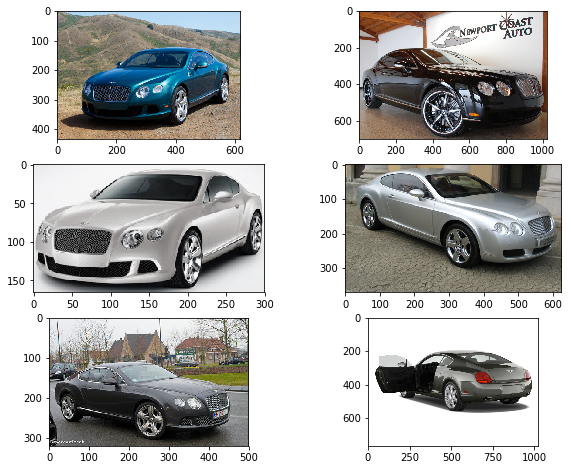

('Dodge Caliber Wagon 2007', 'Dodge Caliber Wagon 2012', 4)


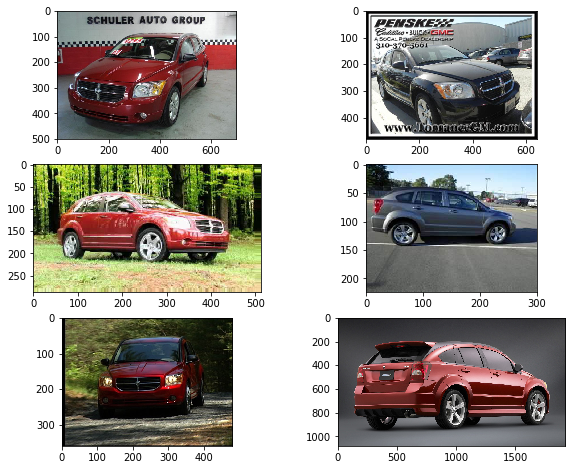

('Audi 100 Sedan 1994', 'Audi 100 Wagon 1994', 3)


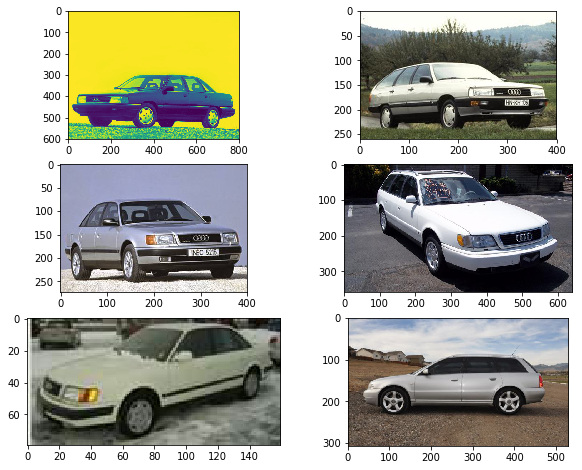

('Chevrolet Silverado 1500 Extended Cab 2012', 'Chevrolet Silverado 1500 Hybrid Crew Cab 2012', 3)


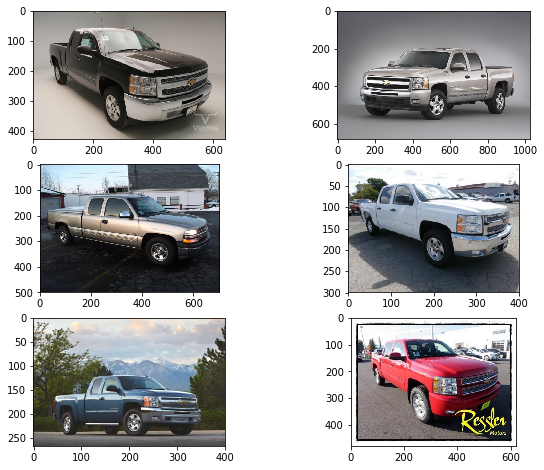

('Dodge Caliber Wagon 2012', 'Dodge Caliber Wagon 2007', 3)


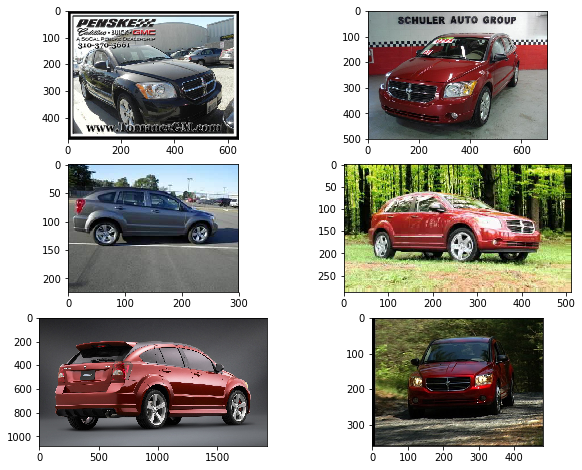

('Ferrari 458 Italia Convertible 2012', 'Ferrari California Convertible 2012', 3)


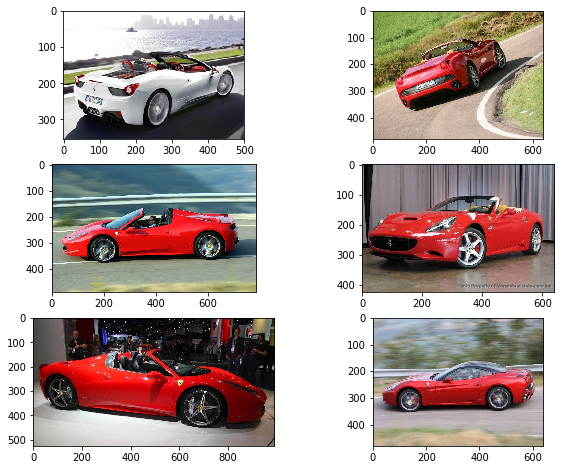

In [36]:
for i in range(0,8):
    compare_most_confused(most_confused=most_confused, path=path, labels_df=labels_df, 
                          num_imgs=3, rank=i)

Compare the classes with the top losses. Visualising the prediction-actual pairs can help understand where the model was getting it wrong

PREDICTION:Chevrolet TrailBlazer SS 2009, ACTUAL:Buick Rainier SUV 2007
Loss: 22.02, Probability: 0.0000


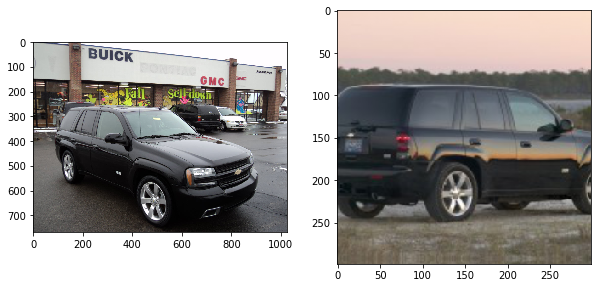

PREDICTION:Ram C/V Cargo Van Minivan 2012, ACTUAL:GMC Yukon Hybrid SUV 2012
Loss: 10.88, Probability: 0.0000


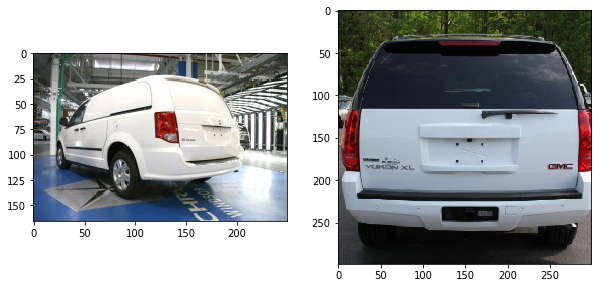

PREDICTION:Acura TSX Sedan 2012, ACTUAL:GMC Terrain SUV 2012
Loss: 10.12, Probability: 0.0000


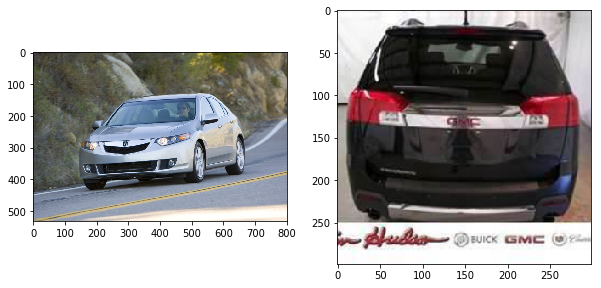

PREDICTION:Daewoo Nubira Wagon 2002, ACTUAL:Jeep Compass SUV 2012
Loss: 9.84, Probability: 0.0000


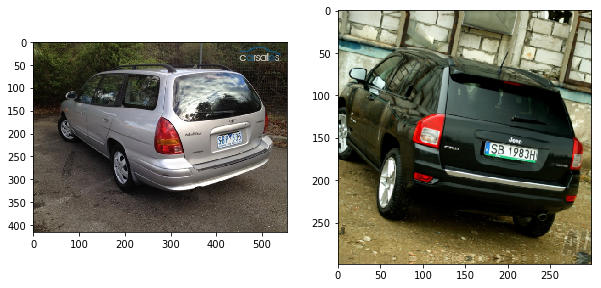

PREDICTION:Audi R8 Coupe 2012, ACTUAL:Aston Martin Virage Coupe 2012
Loss: 9.53, Probability: 0.0000


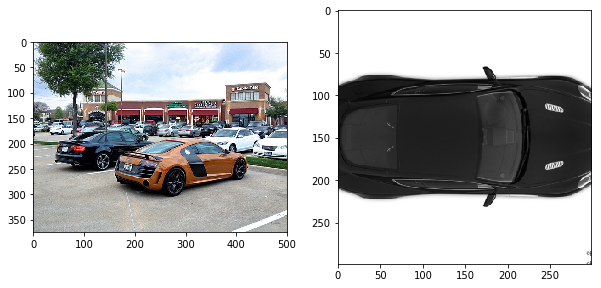

PREDICTION:Lincoln Town Car Sedan 2011, ACTUAL:Chrysler Sebring Convertible 2010
Loss: 9.50, Probability: 0.0000


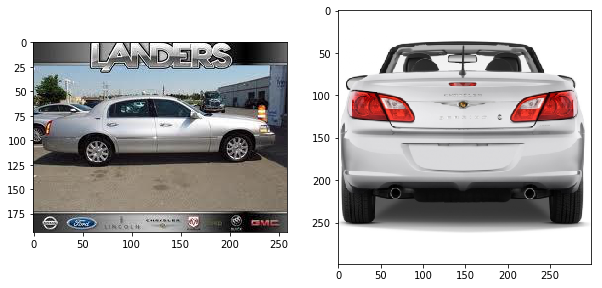

PREDICTION:HUMMER H3T Crew Cab 2010, ACTUAL:HUMMER H2 SUT Crew Cab 2009
Loss: 9.00, Probability: 0.0000


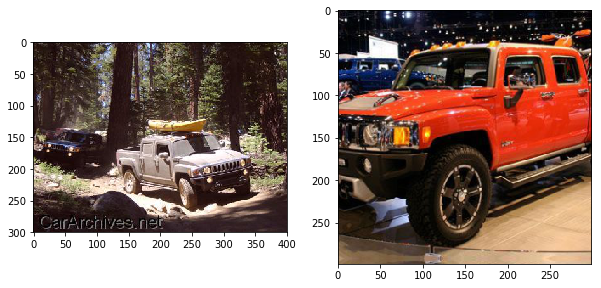

PREDICTION:Dodge Durango SUV 2007, ACTUAL:Ford F-450 Super Duty Crew Cab 2012
Loss: 8.45, Probability: 0.0000


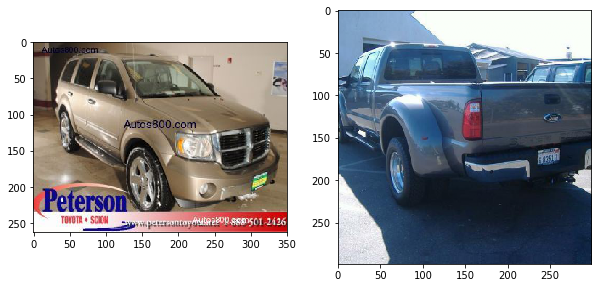

PREDICTION:Hyundai Veracruz SUV 2012, ACTUAL:Ford Edge SUV 2012
Loss: 8.39, Probability: 0.0000


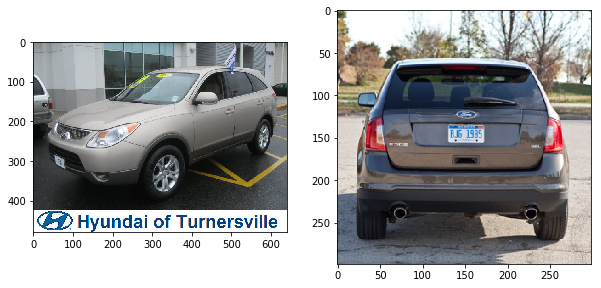

PREDICTION:Ferrari 458 Italia Convertible 2012, ACTUAL:Aston Martin V8 Vantage Convertible 2012
Loss: 8.39, Probability: 0.0000


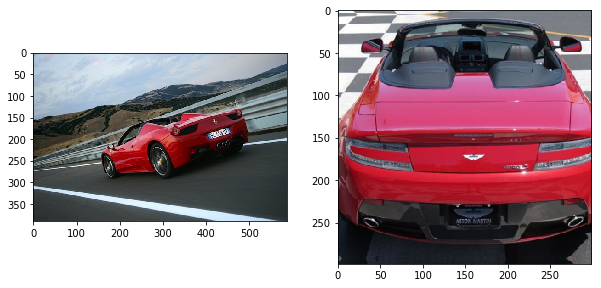

In [38]:
compare_top_losses(10, path, interp, labels_df, 1)

## Test Set Performance

Define the test dataset to check the acurracy on the test set

In [11]:
SZ = 299
SEED = 42
LABEL = 'class_name'

car_tfms = get_transforms()

src = (ImageItemList.from_df(labels_df, path, folder='merged', cols='filename')
       # the 'is_test' column has values of 1 for the test set
       .split_from_df(col='is_test')
       .label_from_df(cols=LABEL))

data_test = (src.transform(car_tfms, size=SZ)
            .databunch()
            .normalize(imagenet_stats))

Assign the full dataset to the Learner, the 'Validation set' here is actually our Test set

In [12]:
learn.data = data_test

Use Test Time Augmentation (TTA) for the predictions on the test set

In [13]:
test_preds, test_ys = learn.TTA()

#### Test with best Stage-3 model:

In [ ]:
accuracy(test_preds, test_ys)

Check Top5 Accuracy (mostly for ego-boosting purposes!)

In [15]:
def accuracy_topk(output, target, topk=(3,)):
    """Computes the precision@k for the specified values of k"""
    maxk = max(topk)
    batch_size = target.size(0)

    _, pred = output.topk(maxk, 1, True, True)
    pred = pred.t()
    correct = pred.eq(target.view(1, -1).expand_as(pred))

    res = []
    for k in topk:
        correct_k = correct[:k].view(-1).float().sum(0, keepdim=True)
        res.append(correct_k.mul_(100.0 / batch_size))
    return res

The Top5 Accuracy was **xx**

In [44]:
accuracy_topk(test_preds, test_ys, topk=(5,))

[tensor([97.3759])]

#### Test with best Stage-4 model:

In [16]:
accuracy(test_preds, test_ys)

tensor(0.8531)

This accuracy of the Stage-4 model was 85.31%

In [17]:
accuracy_topk(test_preds, test_ys, topk=(5,))

[tensor([96.1945])]

Top5 accuracy was 96.19%